# Human Activity Recognition with Smartphones

Будем работать с [датасетом физической активности](https://www.kaggle.com/datasets/uciml/human-activity-recognition-with-smartphones).

В этом датасете собраны данные 30 человек, выполняющих различные действия со смартфоном на поясе. Данные записывались с помощью датчиков (акселерометра и гироскопа) в этом смартфоне. Были зафиксированы: "3-осевое линейное ускорение" (_tAcc-XYZ_) и "3-осевая угловая скорость" (_tGyro-XYZ_).

1. Все сигналы отсортированы по времени, пропущены через фильтр шума.
2. Все наблюдения были разделены на окна по 128 сигналов в каждом, причем окна пересекаются на 50% (грубо говоря, с 1 по 128 сигнал в 1 окно, с 64 до 192 сигнала - во 2 окно и так далее). То есть каждое окно покрывает 2.56 секунды данных (два шага человека при ходьбе, учитывая медленную походку пожилых людей).
3. Линейное ускорение было разделено на две составляющие (с помощью низкочастотного фильтра): ускорение самого тела, а также гравитационная составляющая. Будем называть их ускорением тела и гравитационным ускорением.
4. К получившимся окнам применяли различные функции для получения следующих показателей:
    - max
    - min
    - mad (median)
    - mean
    - std
    - skewness (коэффициент асимметричности распределения признака в окне)
    - etc. (подробнее, на сколько это возможно, указано в [самой статье](https://www.esann.org/sites/default/files/proceedings/legacy/es2013-84.pdf))
5. Величина (magnitude) сигнала также определялась через евклидову норму всех значений из вектора для одного окна.
6. К окнам было применено преобразование Фурье, чтобы получить частоты. Из частот были извелченыте же показатели, плюс новые:
    - bandsEnergy (энергия частотного интервала)
7. Были посчитаны углы между векторами соответствующих окон.
8. Для ускорений были посчитаны производные - рывки, к которым применялись те же функции.

Итог: в датасете каждый признак - это какая-то операция над вектором из 128 чисел, которые соответствуют замерам определенного человека занятого какой-то активностью на протяжении 2.56 секунд.

Как читать названия признаков? Примеры:
- `tBodyAccMag-mean()` - это вектор ускорений тела (без гравитационной составляющей этого ускорения), из которого взяли евклидову норму, а затем усреднили, чтобы получить скаляр
- `fBodyAcc-bandsEnergy()-1,8.2` - это вектор ускорения тела, к которому применили преобразование Фурье, преобразовав его в вектор частот, а затем посчитали на этом векторе энергию данного частотного интервала в определенном диапазоне частот (в данном случае 1 - 8.2)
- `angle(X,gravityMean)` - это угол между осью Х и вектором усредненных значений гравитационного ускорения из соответствующего окна

#### Загрузим и предобработаем данные

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [3]:
train = pd.read_csv('data/train.csv')
test = pd.read_csv('data/test.csv')

train.shape, test.shape

((7352, 563), (2947, 563))

#### Будем равотать на ограниченном подмножестве признаков

In [4]:
cols_subset = [
    'tBodyAccMag-mean()',  # усредненная величина ускорения тела
    'tBodyGyroJerk-mad()-X',  # медианная величина рывка тела по оси Х
    'tGravityAcc-min()-X',  # минимум гравитационной составляющей ускорения по оси Х
    'tBodyAcc-max()-X',  # максимальная величина ускорения тела по оси Х
    'fBodyAcc-bandsEnergy()-1,8.2',  # энергия ускорения тела в интервале частоты
    'angle(X,gravityMean)',  # угол между осью Х и усредненной гравитационной составляющей ускорения
    'angle(Y,gravityMean)',  # угол между осью Y и усредненной гравитационной составляющей ускорения
    'angle(Z,gravityMean)',  # угол между осью Z и усредненной гравитационной составляющей ускорения,
    'fBodyAcc-skewness()-X',  # асимметричность частоты ускорения тела по оси Х
    'subject',  # номер испытуемого
    'Activity',  # название вида деятельности (целевая переменная)
]

In [5]:
train = train[cols_subset]
test = test[cols_subset]

#### Посмотрим на пропуски/дубли в данных

In [6]:
print(f'test:\nПропуски в test: {test.isnull().sum().sum()}\nОдинаковые значения есть в столбцах: {test.agg(lambda x: x.nunique() != x.shape[0])[lambda x: x].index.tolist()}\nОдинаковых строк: {test.duplicated().sum()}')
print(f'train:\nПропуски в train: {train.isnull().sum().sum()}\nОдинаковые значения есть в столбцах: {train.agg(lambda x: x.nunique() != x.shape[0])[lambda x: x].index.tolist()}\nОдинаковых строк: {train.duplicated().sum()}')

test:
Пропуски в test: 0
Одинаковые значения есть в столбцах: ['tBodyGyroJerk-mad()-X', 'tGravityAcc-min()-X', 'tBodyAcc-max()-X', 'fBodyAcc-bandsEnergy()-1,8.2', 'subject', 'Activity']
Одинаковых строк: 0
train:
Пропуски в train: 0
Одинаковые значения есть в столбцах: ['tBodyAccMag-mean()', 'tBodyGyroJerk-mad()-X', 'tGravityAcc-min()-X', 'tBodyAcc-max()-X', 'fBodyAcc-bandsEnergy()-1,8.2', 'fBodyAcc-skewness()-X', 'subject', 'Activity']
Одинаковых строк: 0


Пропусков в данных нет, дупликатов(одинаковых строк) тоже нет. Встречаются одинаковые данные в отдельно взятых столбцах, это могло произойти из-за: 
* Наложения окон, особенно для max и min  
* Стабильности в действии, если человек сидит или стоит  
* Также не стоит исключать вероятность совпадения показателей у хотя бы двоих из тридцати людей.

#### Посмотрим на основные статистики в данных

In [7]:
stat = train.drop('subject', axis=1).describe().merge(test.drop('subject', axis=1).describe(), how='outer', left_index=True, right_index=True, suffixes=['(train)', '(test)'])
stat = stat[
    ['tBodyAccMag-mean()(train)', 'tBodyAccMag-mean()(test)', 
    'tBodyGyroJerk-mad()-X(train)', 'tBodyGyroJerk-mad()-X(test)', 
    'tGravityAcc-min()-X(train)', 'tGravityAcc-min()-X(test)', 
    'tBodyAcc-max()-X(train)', 'tBodyAcc-max()-X(test)', 
    'fBodyAcc-bandsEnergy()-1,8.2(train)', 'fBodyAcc-bandsEnergy()-1,8.2(test)', 
    'angle(X,gravityMean)(train)', 'angle(X,gravityMean)(test)', 
    'angle(Y,gravityMean)(train)', 'angle(Y,gravityMean)(test)', 
    'angle(Z,gravityMean)(train)', 'angle(Z,gravityMean)(test)', 
    'fBodyAcc-skewness()-X(train)', 'fBodyAcc-skewness()-X(test)']
]

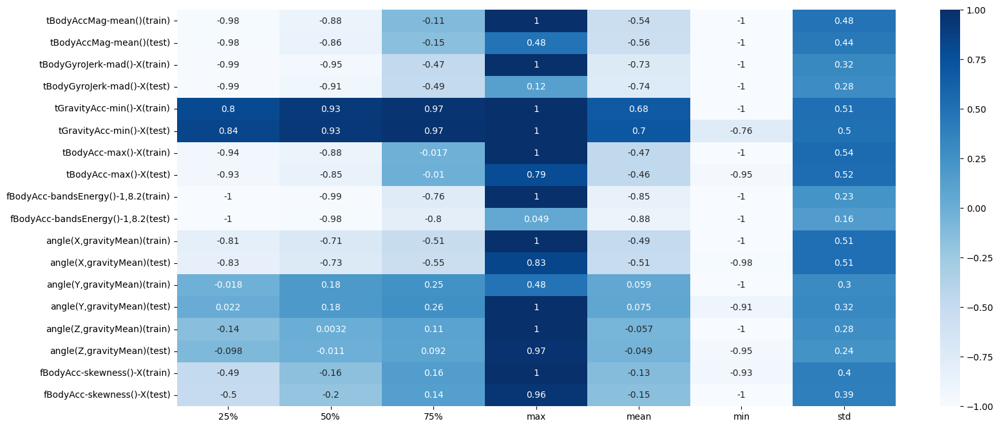

In [8]:
plt.figure(figsize=(18, 8))
sns.heatmap(stat.drop('count', axis=0).T, cmap='Blues', annot=True)
plt.show()

В целом данные в `train` и `test` статистически схожи, но если посмотореть на max, то можно заметить, что для `tBodyAccMag-mean()`, `tBodyGyroJerk-mad()-X`, `fBodyAcc-bandsEnergy()-1,8.2` в `train` максимальные значения гораздо выше чем в `test`, обратная ситуация наблюдается в `angle(Y,gravityMean)`. Также можно заметить ассиметричность в распределении некторых признаков, например в `tBodyAccMag-mean()`

#### Проверим сбалансированность

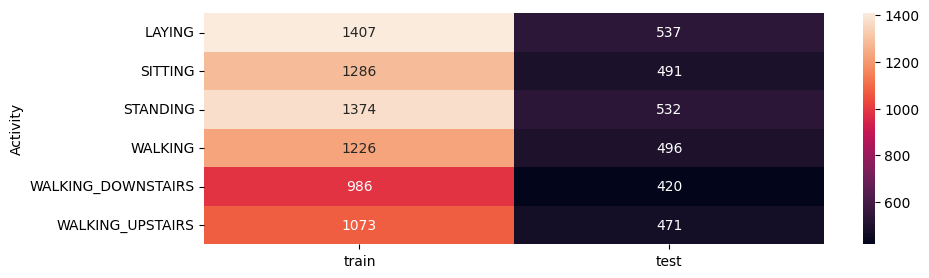

Разница между самой большой и маленькой в train: 30%
Разница между самой большой и маленькой в test: 22%


In [9]:
train_act = train.groupby('Activity').count()['subject']
test_act = test.groupby('Activity').count()['subject']

train_act.name = 'train'
test_act.name = 'test'

act = pd.concat([train_act, test_act], axis=1)

plt.figure(figsize=(10, 3))
sns.heatmap(act, annot=True, fmt='.0f')
plt.show()
print(f'Разница между самой большой и маленькой в train: {round((act['train'].max() - act['train'].min()) / act['train'].max() * 100.0)}%')
print(f'Разница между самой большой и маленькой в test: {round((act['test'].max() - act['test'].min()) / act['test'].max() * 100.0)}%')

##### Данные сбалансированны

### Посмотрим корреляции

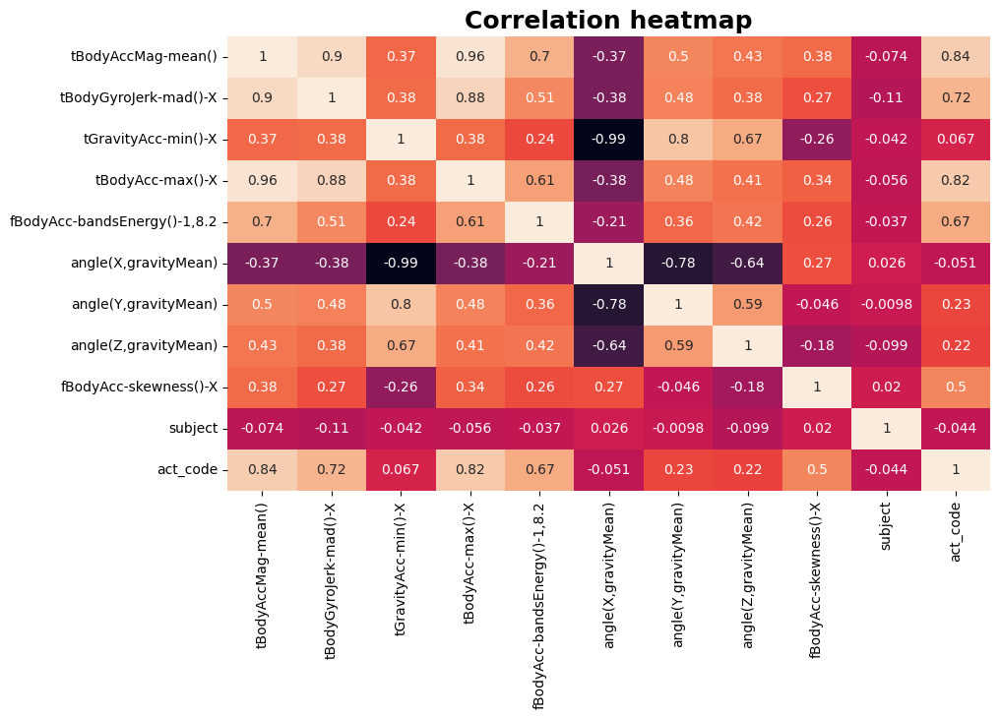

In [10]:
train['act_code'], _ = pd.factorize(train['Activity'])
plt.figure(figsize=(10, 6))
sns.heatmap(train.corr(numeric_only=True), annot=True, cbar=False)
plt.title('Correlation heatmap', fontweight='bold', fontsize=18)
plt.show()

Можно заметить достаточно высокий уровень корреляции между физическими признаками, так как они характеризуют показатели физической активности. Корреляция таргета высока **почти** со всеми показателями, это означает, что признаки важны. Признаки `tBodyAcc-max()-X` и `tBodyAccMag-mean()` показывают почти полную зависимость - _0.95_. Аналогично с признакми `tGravityAcc-min()-X` и `angle(X,gravityMean)` - _-0.98_, возможно, некоторые из них избыточны. Признаки `tBodyAccMag-mean()`, `tBodyAcc-max()-X`, `tBodyGyroJerk-mad()-X` и `fBodyAcc-bandsEnergy()-1,8.2` имеют самую высокую корреляцию с таргетом.

### Посмотрим на mean body acceleration для каждой активности

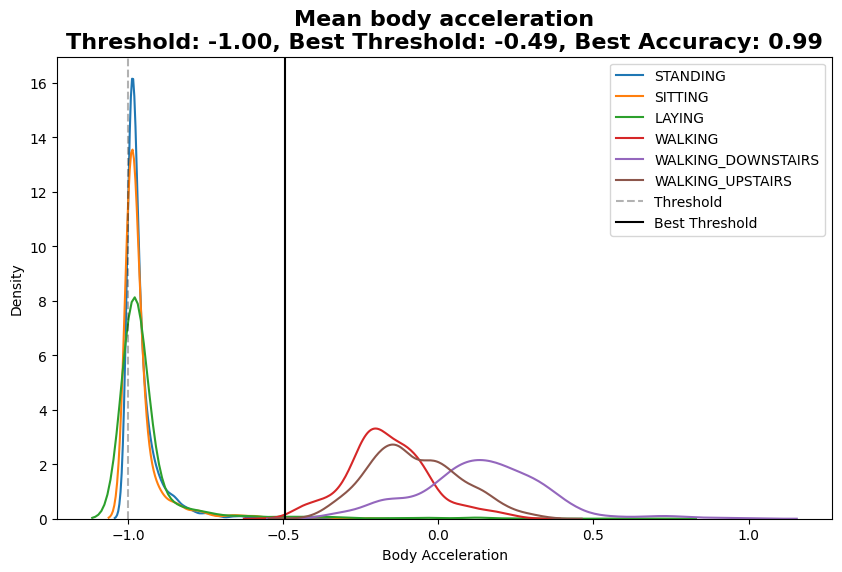

In [11]:
import matplotlib.animation as animation
from IPython.display import HTML


train['True type of activity'] = np.where(train['Activity'].isin(['SITTING', 'STANDING', 'LAYING']), 'Static', 'Dynamic')

fig, ax = plt.subplots(figsize=(10, 6))

for activity in train['Activity'].unique():
    sns.kdeplot(train[train['Activity'] == activity]['tBodyAccMag-mean()'], label=activity, ax=ax)

ax.set_xlabel('Body Acceleration')
ax.set_title('Mean body acceleration for activities', fontweight='bold', fontsize=16)
ax.legend(title='Activity')

threshold_line = ax.axvline(x=-1, linestyle='--', color='black', label='Threshold', alpha=0.3)
best_threshold_line = ax.axvline(x=-1, linestyle='-', color='black', label='Best Threshold')
ax.legend()

best_accuracy = 0
best_threshold = -1

def calc_accuracy(threshold):
    train['Type of activity'] = np.where(train['tBodyAccMag-mean()'] < threshold, 'Static', 'Dynamic')
    right_ans = train[train['Type of activity'] == train['True type of activity']].shape[0]
    all_ans = train.shape[0]
    return right_ans / all_ans

def update(frame):
    global best_accuracy, best_threshold
    current_threshold = np.linspace(-1, 1, 100)[frame]  
    threshold_line.set_xdata([current_threshold])
    
    current_accuracy = calc_accuracy(current_threshold)
    
    if current_accuracy > best_accuracy:
        best_accuracy = current_accuracy
        best_threshold = current_threshold
        best_threshold_line.set_xdata([best_threshold])
    
    ax.set_title(f'Mean body acceleration\nThreshold: {current_threshold:.2f}, 'f'Best Threshold: {best_threshold:.2f}, Best Accuracy: {best_accuracy:.2f}', fontweight='bold', fontsize=16)
    
    return threshold_line, best_threshold_line

ani = animation.FuncAnimation(fig, update, frames=100, interval=50, blit=False)

HTML(ani.to_jshtml())

In [12]:
# Разделим активности на две группы исходя из линии
train['Type of activity'] = np.where(train['tBodyAccMag-mean()'] < round(best_threshold, 2), 'Static', 'Dynamic')
wrong_ans = train[train['Type of activity'] != train['True type of activity']].shape[0] # Неправильные
right_ans = train[train['Type of activity'] == train['True type of activity']].shape[0] # Правильные
all_ans = train.shape[0]

print(f'Всего: {all_ans}, Правильные: {right_ans}, Неправильные: {wrong_ans}')
print(f'Доля верных ответов (accuracy): {right_ans / all_ans}')

# Посмотрим, что происходит чаще: Static, при верном ответе Dynamic? или наоборот?
print(f'Неправильно определили Static: {train[(train['True type of activity'] == 'Static') & (train['Type of activity'] == 'Dynamic')].shape[0]}')
print(f'Неправильно определили Dynamic: {train[(train['True type of activity'] == 'Dynamic') & (train['Type of activity'] == 'Static')].shape[0]}')

Всего: 7352, Правильные: 7297, Неправильные: 55
Доля верных ответов (accuracy): 0.9925190424374319
Неправильно определили Static: 53
Неправильно определили Dynamic: 2


Доля правильных ответов для линии - 0.99. Среднее ускорение тела напрямую харектиризует статично действие или динамично. В 53 из 55 случаев ошибки, активность была статичной, но по линии - динамичной. Отсечением по одному признаку можно добиться хорошо качества разделения на две группы.

### Посмотрим на `angle(X,gravityMean)` с разделением по разным видам активности на данных

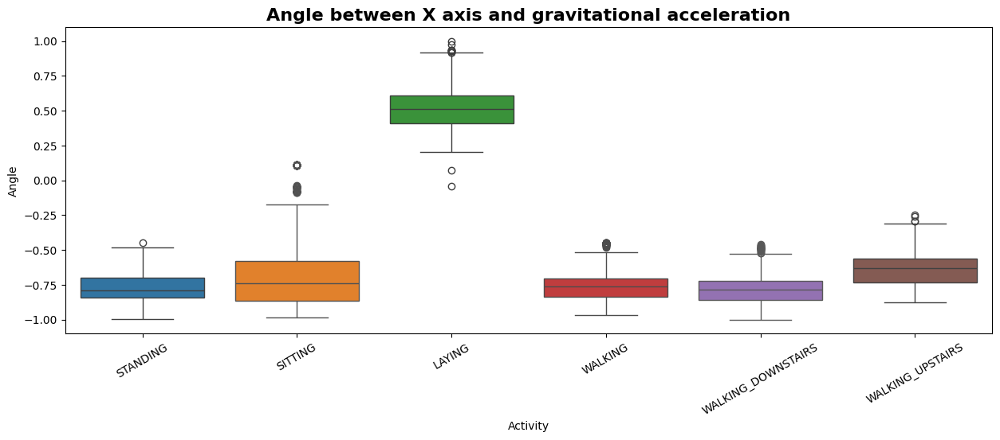

In [13]:
fig = plt.figure(figsize=(15, 5))
ax = fig.add_subplot(1, 1, 1)
for activity in train['Activity'].unique():
    sns.boxplot(x='Activity', y='angle(X,gravityMean)', data=train[train['Activity'] == activity], ax=ax)
plt.xticks(rotation=30)
plt.ylabel('Angle')
plt.title('Angle between X axis and gravitational acceleration', fontweight='bold', fontsize=16)
plt.show()

Данные на графике отражают углы между положением человека и ускорением гравитации. Положение человека лежа значительно выделяется, так как во всех остальных активностях человек расположен относительно вертикально (может немного наклонятся при подъемах и спусках на лестницах и ходьбе). Выбросы при сидении могут быть связаны с разным положением, например из-за наклона спинки стула или кресла. Также среди динамических активностей можно выделить `WALKING_UPSTAIRS`

### Посмотрим теперь на `tBodyAcc-max()-X`

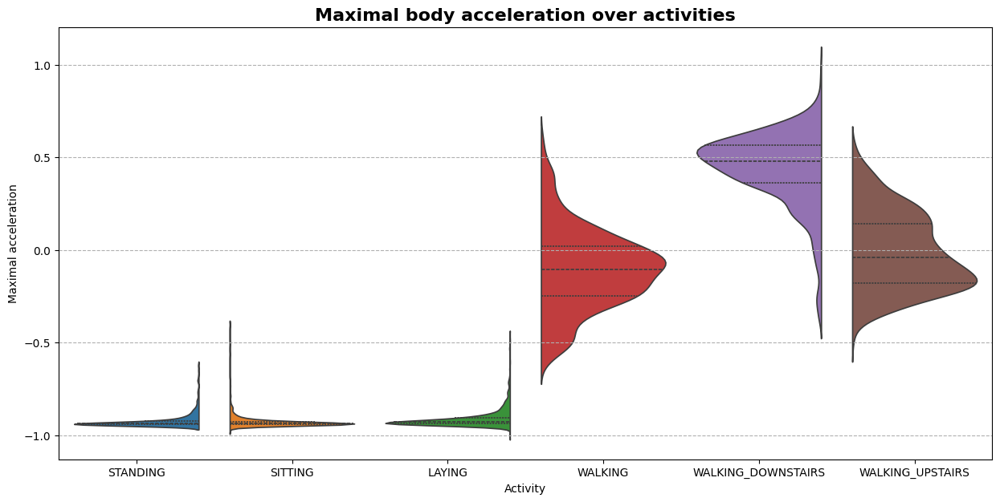

In [14]:
fig = plt.figure(figsize=(15, 7))
ax = fig.add_subplot(1, 1, 1)
sns.violinplot(x='Activity', y='tBodyAcc-max()-X', data=train, ax=ax, inner='quartile', orient='x', split=True, hue='Activity')
plt.ylabel('Maximal acceleration')
plt.title('Maximal body acceleration over activities', fontweight='bold', fontsize=16) 
plt.grid(axis='y', linestyle='--', visible=0.6)
plt.show()

Среди всех активностей больше всего выделяется спуск по лестнице, у него самое большое ускорение. Это может быть связано с тем, что человек достаточно резко разгоняется при начале спуска, и резко замедляется в конце, подходя к следующему пролету.

### Теперь посмотрим на распределения `fBodyAcc-bandsEnergy()-1,8.2` для динамичных активностей и `angle(Y,gravityMean)` для статических

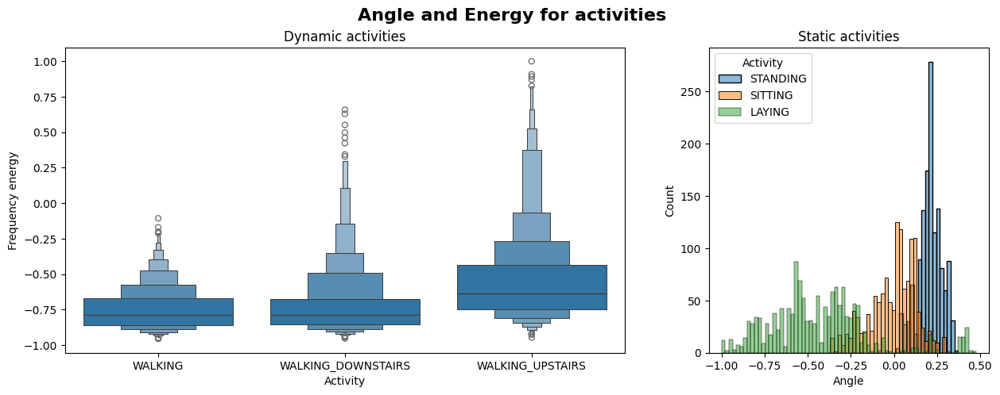

In [15]:
train_dyn = train[train['True type of activity'] == 'Dynamic']
train_stat = train[train['True type of activity'] == 'Static']

fig = plt.figure(figsize=(15, 5))
grid_spec = fig.add_gridspec(1, 2, width_ratios=[2, 1])
ax = fig.add_subplot(grid_spec[0])

sns.boxenplot(x='Activity', y='fBodyAcc-bandsEnergy()-1,8.2', data=train_dyn, ax=ax)
ax.set_title('Dynamic activities')
ax.set_ylabel('Frequency energy')

ax = fig.add_subplot(grid_spec[1])
for activity in train_stat['Activity'].unique():
    sns.histplot(x='angle(Y,gravityMean)', data=train_stat[train_stat['Activity'] == activity], ax=ax, alpha=.5, label=activity, binwidth=.021)
ax.set_title('Static activities')
ax.set_xlabel('Angle')
ax.legend(title='Activity')

fig.suptitle('Angle and Energy for activities', fontweight='bold', fontsize=16)
plt.show()

Среди статических активностей можно выделить положение стоя - чаще всего угол между осью Y и средним направлением гравитации в пределах 0.15 - 0.3, в положении лежа это значение чаще всего составляет -1 - -0.3. Среди динамических активностей по энергии ускорения тела, выделяется подъем по лестнице на фоне простой ходьбы и немного на фоне спуска по лестнице.

##### Рассмотрим только статические активности: боксплот распределения `fBodyAcc-skewness()-X` по активностям и не все наблюдения данной группы активностей, а только их часть. Разделимы ли категории по `fBodyAcc-skewness()-X`? А если взять только те строки, где `fBodyAcc-skewness()-X < -0.376`.

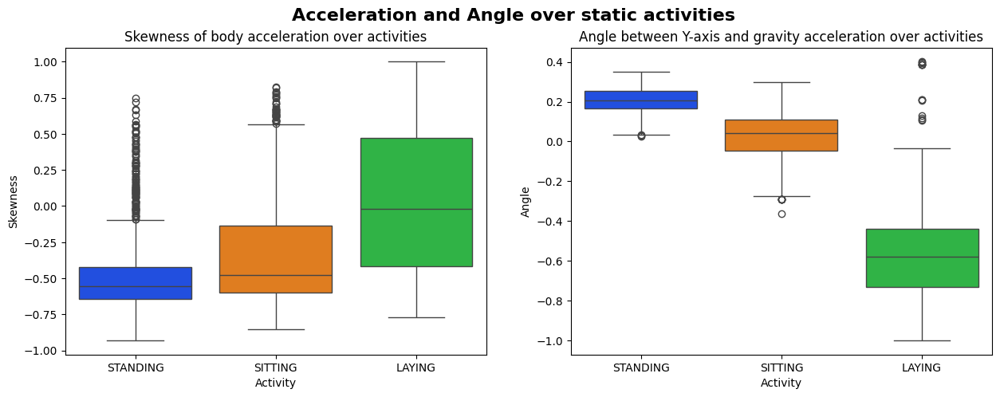

In [16]:
fig = plt.figure(figsize=(15, 5))

ax = fig.add_subplot(1, 2, 1)
sns.boxplot(x='Activity', y='fBodyAcc-skewness()-X', data=train_stat, ax=ax, palette='bright', hue='Activity', legend=False)
ax.set_ylabel('Skewness')
ax.set_title('Skewness of body acceleration over activities')

ax = fig.add_subplot(1, 2, 2)
sns.boxplot(x='Activity', y='angle(Y,gravityMean)', data=train_stat[train_stat['fBodyAcc-skewness()-X'] < -0.376], ax=ax, palette='bright', hue='Activity', legend=False)
ax.set_ylabel('Angle')
ax.set_title('Angle between Y-axis and gravity acceleration over activities')

fig.suptitle('Acceleration and Angle over static activities', fontweight='bold', fontsize=16)

plt.show()

Разделение по `fBodyAcc-skewness()-X` затруднено из-за перекрытия и выбросов. По признаку `angle(Y,gravityMean)` выделятся **_LAYNG_** на фоне остальных статических активностей. Также можно с небольшой точностью отделить `STANDING` и `SITTING` (правый график).

### Выделим последнюю активность

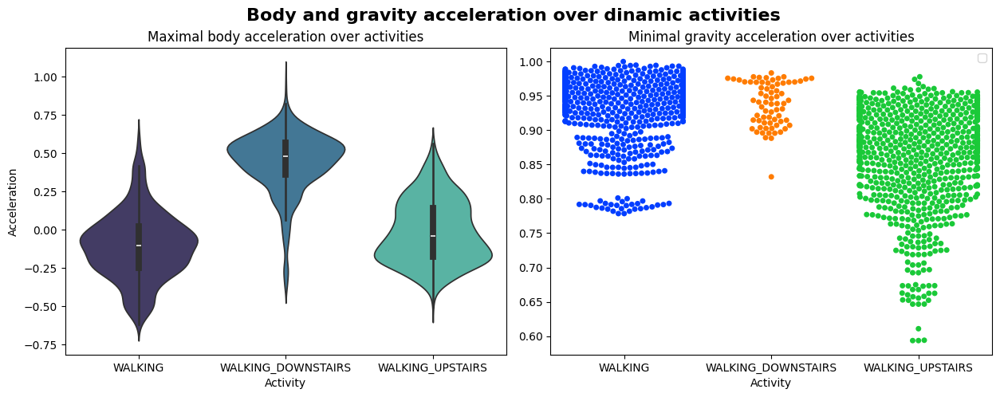

In [17]:
fig = plt.figure(figsize=(15, 5))

ax = fig.add_subplot(1, 2, 1)
sns.violinplot(x='Activity', y='tBodyAcc-max()-X', data=train_dyn, palette="mako", ax=ax)
ax.set_title('Maximal body acceleration over activities')
ax.set_ylabel('Acceleration')

ax = fig.add_subplot(1, 2, 2)
sns.swarmplot(x='Activity', y='tGravityAcc-min()-X', data=train_dyn[train_dyn['tBodyAcc-max()-X'] < 0.157], ax=ax, palette='bright')
ax.set_ylabel('')
ax.set_title('Minimal gravity acceleration over activities')

fig.suptitle('Body and gravity acceleration over dinamic activities', fontweight='bold', fontsize=16)
plt.legend()
fig.subplots_adjust(wspace=0.1)
plt.show()

### Визулизируем данные в 2D и 3D

In [60]:
%%time
from sklearn.manifold import TSNE
tsne = TSNE(random_state=666, n_components=2)
new = tsne.fit_transform(train.drop(['subject', 'Activity', 'True type of activity', 'Type of activity'], axis=1))
df_2_comp = pd.concat([pd.DataFrame(new, columns=['x', 'y']), train['Activity']], axis=1)

tsne = TSNE(random_state=666, n_components=3)
new = tsne.fit_transform(train.drop(['subject', 'Activity', 'True type of activity', 'Type of activity'], axis=1))
df_3_comp = pd.concat([pd.DataFrame(new, columns=['x', 'y', 'z']), train['Activity']], axis=1)

CPU times: user 2min 50s, sys: 47.2 s, total: 3min 38s
Wall time: 38.5 s


In [61]:
import plotly.express as px
px.scatter(data_frame=df_2_comp, x='x', y='y', color='Activity', title='2D scatter')

In [62]:
px.scatter_3d(data_frame=df_3_comp, x='x', y='y', z='z', color='Activity', title='3D scatter')

### Постороим модель

In [18]:
act_code = {act : i for i, act in enumerate(train['Activity'].unique())}

In [19]:
train['act_code'] = train['Activity'].apply(lambda x: act_code[x])
test['act_code'] = test['Activity'].apply(lambda x: act_code[x])

In [20]:
X_train, y_train = train.drop(['True type of activity', 'Type of activity', 'subject', 'Activity', 'act_code'], axis=1), train['act_code']
X_test, y_test = test.drop(['True type of activity', 'Type of activity', 'subject', 'Activity', 'act_code'], axis=1, errors='ignore'), test['act_code']

In [21]:
from sklearn.linear_model import LogisticRegressionCV
from sklearn.metrics import accuracy_score

In [22]:
lr = LogisticRegressionCV(cv=10, max_iter=1000).fit(X_train, y_train)

print(f'Accuracy score on train set {accuracy_score(y_train, lr.predict(X_train)):.3f}')
print(f'Accuracy score on test set {accuracy_score(y_test, lr.predict(X_test)):.3f}')

Accuracy score on train set 0.905
Accuracy score on test set 0.825
